<a href="https://colab.research.google.com/github/nhathaogit/Sign_Detetion_Model_Yolov8L/blob/main/finetuned_yolo_sign_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install ultralytics

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
from ultralytics import YOLO

# 1. Chọn mô hình (ví dụ: yolov8n.pt)
model = YOLO('yolov8l.pt')

# 2. Đường dẫn MỚI đến file .yaml
data_yaml_path = r'/content/drive/MyDrive/train_data/custom_data.yaml'

# 3. Bắt đầu huấn luyện
print("Bắt đầu huấn luyện...")
results = model.train(
    data=data_yaml_path,
    epochs=100,
    imgsz=640,
    batch=16,
    single_cls=True,
    project='/content/drive/MyDrive/YOLO_Results_Large_Model',
    name='traffic_sign_model_v1',

    # === THÊM CÁC THAM SỐ AUGMENTATION ===
    augment=True,
    degrees=10.0,
    translate=0.1,
    scale=0.1,
    shear=5.0,
    perspective=0.001,
    flipud=0.0,
    fliplr=0.5,
    lr0=0.0005,
    lrf=0.005lr0=0.0005,  # Giảm tốc độ học (ví dụ: 0.0005)
    lrf=0.005
)

print("Hoàn tất huấn luyện!")
print(f"Kết quả được lưu tại thư mục 'project' bạn đã chỉ định.")

Bắt đầu huấn luyện...
Ultralytics 8.3.225 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=True, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/train_data/custom_data.yaml, degrees=10.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.0005, lrf=0.005, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8l.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=traffic_sign_model_v12, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, ove

Đang tải mô hình từ: /content/drive/MyDrive/YOLO_Results_Large_Model/traffic_sign_model_v12/weights/best.pt
Đang chạy dự đoán trên: /content/anh_duong_pho_3.jpg

image 1/1 /content/anh_duong_pho_3.jpg: 480x640 4 items, 55.1ms
Speed: 2.6ms preprocess, 55.1ms inference, 1.2ms postprocess per image at shape (1, 3, 480, 640)
Hiển thị ảnh kết quả (đã vẽ bounding box):


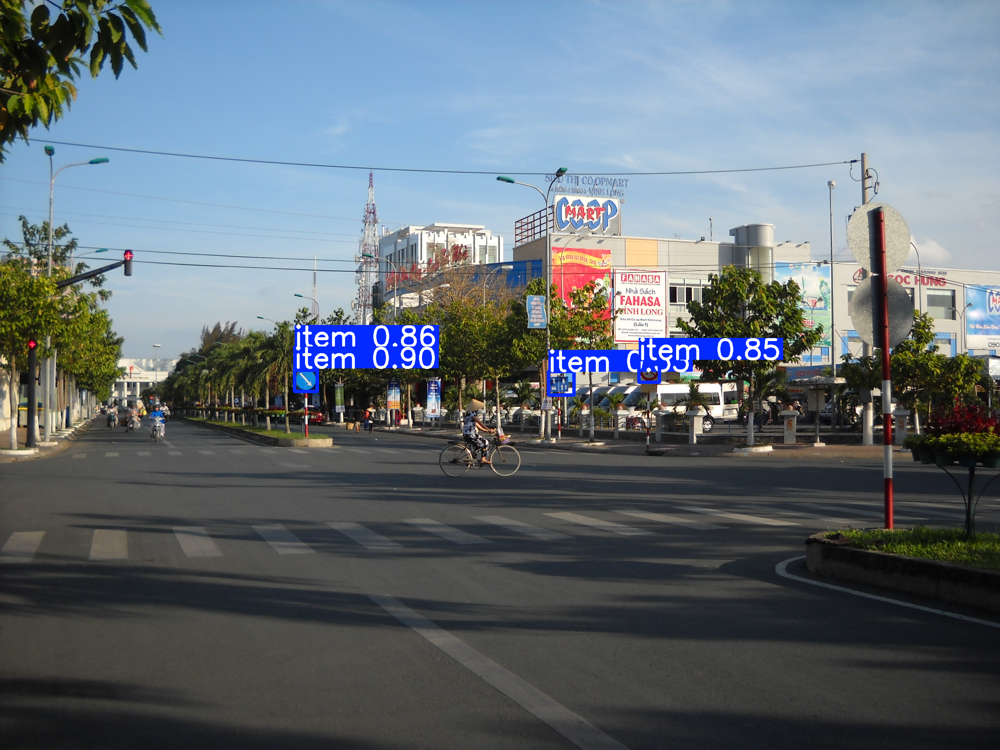

In [ ]:
from ultralytics import YOLO
from google.colab.patches import cv2_imshow # Dùng để hiển thị ảnh trong Colab
import cv2

# --- BẠN CẦN THAY ĐỔI 2 ĐƯỜNG DẪN DƯỚI ĐÂY ---

# 1. ĐƯỜNG DẪN ĐẾN FILE TRỌNG SỐ (best.pt) BẠN VỪA HUẤN LUYỆN
# (Hãy đảm bảo tên thư mục 'name' là chính xác, ví dụ: 'traffic_sign_model_v15'
# hoặc 'traffic_sign_model_YOLOv8x' tùy bạn)

model_path = '/content/drive/MyDrive/YOLO_Results_Large_Model/traffic_sign_model_v12/weights/best.pt'

# 2. ĐƯỜNG DẪN ĐẾN ẢNH BẠN MUỐN THỬ NGHIỆM
# (Lấy một ảnh bất kỳ, ví dụ từ tập test của bạn)

image_path = '/content/anh_duong_pho_3.jpg'

# -------------------------------------------------


# 3. Tải mô hình đã huấn luyện
print(f"Đang tải mô hình từ: {model_path}")
model = YOLO(model_path)

# 4. Chạy dự đoán trên ảnh
# conf=0.5 là ngưỡng tự tin (confidence threshold)
# Chỉ những phát hiện có độ tự tin > 50% mới được hiển thị
print(f"Đang chạy dự đoán trên: {image_path}")
results = model.predict(source=image_path, conf=0.5)

# 5. Hiển thị kết quả
# 'results' là một danh sách (list), ta lấy phần tử đầu tiên
result = results[0]

# .plot() là một hàm tiện lợi của Ultralytics
# nó tự động vẽ các bounding box lên ảnh gốc
annotated_image = result.plot()

print("Hiển thị ảnh kết quả (đã vẽ bounding box):")
# Hiển thị ảnh trong Colab
cv2_imshow(annotated_image)